## 1. Import Necessary Libraries

In [1]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import random
import zipfile

import ipywidgets as widgets
from six import BytesIO
from IPython.display import display
from PIL import Image
import shutil

import tensorflow as tf
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

In [52]:
# CPU Optimizations 
tf.config.experimental.set_virtual_device_configuration(
    tf.config.experimental.list_physical_devices("CPU")[0],
    [tf.config.experimental.VirtualDeviceConfiguration()],
)

# GPU Memory Limit Optimization
tf.config.set_logical_device_configuration(
    tf.config.list_physical_devices("GPU")[0],
    [tf.config.LogicalDeviceConfiguration(memory_limit=10799)],
)

## 2. Unzip the Uploaded Data (Skip this Process if Already Run It)

In [2]:
# Unzip the dataset
with zipfile.ZipFile("data_raw/openfoodfacts_nutrition-table-detection.zip", 'r') as zip_ref:
    zip_ref.extractall("data_raw")

## 3. Create New Dataset Folder (Skip this Process if Already Run It)

In [ ]:
# Source and destination paths
source_path = "data_raw/openfoodfacts_nutrition-table-detection"
destination_path = "data/nutri_table"

# New folder and file paths
train_images_destination = os.path.join(destination_path, "train")
val_images_destination = os.path.join(destination_path, "val")
train_csv_destination = os.path.join(destination_path, "train.csv")
val_csv_destination = os.path.join(destination_path, "val.csv")

# Create new folders
os.makedirs(train_images_destination, exist_ok=True)
os.makedirs(val_images_destination, exist_ok=True)

# Combine train folders
train_folders = ["0000", "0001"]
for folder in train_folders:
    folder_path = os.path.join(source_path, "train", folder)
    for image_file in os.listdir(folder_path):
        src_file = os.path.join(folder_path, image_file)
        dst_file = os.path.join(train_images_destination, image_file)
        shutil.copy(src_file, dst_file)

# Combine val folder
val_folder = "0000"
val_folder_path = os.path.join(source_path, "val", val_folder)
for image_file in os.listdir(val_folder_path):
    src_file = os.path.join(val_folder_path, image_file)
    dst_file = os.path.join(val_images_destination, image_file)
    shutil.copy(src_file, dst_file)

# Combine CSV files
train_csv_files = ["train-0000.csv", "train-0001.csv"]
train_dfs = [pd.read_csv(os.path.join(source_path, csv_file)) for csv_file in train_csv_files]
train_combined_df = pd.concat(train_dfs, ignore_index=True)
train_combined_df.to_csv(train_csv_destination, index=False)

val_csv_file = "val-0000.csv"
val_df = pd.read_csv(os.path.join(source_path, val_csv_file))
val_df.to_csv(val_csv_destination, index=False)

print(f"Data has been successfully organized in the folder: {destination_path}")

Data has been successfully organized in the folder: data/nutri_table


## 4. Data Preprocessing (Skip this Process if Already Run It)

In this process, We will filter the data that only "nutrition-table" label

In [ ]:
# Load Train Dataset
df_train_raw = pd.read_csv('data/nutri_table/train.csv')

# Load necessary columns
df_train_filtered = df_train_raw[['image_id', 'width', 'height', 'table_bbox', 'category_name']]

# load data that only has category_name "['nutrition-table']"
df_train_filtered = df_train_filtered[df_train_filtered['category_name'].apply(lambda x: x == '[\'nutrition-table\']')]
df_train_filtered = df_train_filtered[df_train_filtered['width'].apply(lambda x: x < 3000)]
df_train_filtered = df_train_filtered[df_train_filtered['height'].apply(lambda x: x < 3000)]
df_train_filtered = df_train_filtered.drop(columns=['category_name'])
df_train_filtered = df_train_filtered.reset_index(drop=True)
df_train_filtered.info()
df_train_filtered

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 545 entries, 0 to 544
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    545 non-null    object
 1   width       545 non-null    int64 
 2   height      545 non-null    int64 
 3   table_bbox  545 non-null    object
dtypes: int64(2), object(2)
memory usage: 17.2+ KB


,image_id,width,height,table_bbox
0,0009800892204_1,2592,1944,"[array([0.05709876, 0.01427469, 0.60350156, 0...."
1,0024842112219_3,306,408,"[array([0.15196079, 0.14705883, 0.5882353 , 0...."
2,3560070581849_11,692,720,"[array([0.00833333, 0.01011561, 0.99444443, 0...."
3,25231656_1,1944,2592,"[array([0.25124797, 0.14320119, 0.46832615, 0...."
4,0071300000021_4,2000,2666,"[array([0.00937734, 0.00358531, 0.84208554, 0...."
...,...,...,...,...
540,3033490524494_6,1087,1469,"[array([0., 0., 1., 1.], dtype=float32)]"
541,0072457331075_1,1751,1257,"[array([0.34765315, 0.03826385, 0.98011136, 1...."
542,50354252_1,2592,1944,"[array([0.51036274, 0.2945423 , 0.66777116, 0...."
543,26154404_2,2000,1125,"[array([0.03288889, 0.267 , 0.43100584, 0...."


In [ ]:
# Load Validation Dataset
df_val_raw = pd.read_csv('data/nutri_table/val.csv')

# Load necessary columns
df_val_filtered = df_val_raw[['image_id', 'width', 'height', 'table_bbox', 'category_name']]

# load data that only has category_name "['nutrition-table']"
df_val_filtered = df_val_filtered[df_val_filtered['category_name'].apply(lambda x: x == '[\'nutrition-table\']')]
df_val_filtered = df_val_filtered[df_val_filtered['width'].apply(lambda x: x < 3000)]
df_val_filtered = df_val_filtered[df_val_filtered['height'].apply(lambda x: x < 3000)]
df_val_filtered = df_val_filtered.drop(columns=['category_name'])
df_val_filtered = df_val_filtered.reset_index(drop=True)
df_val_filtered.info()
df_val_filtered

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    58 non-null     object
 1   width       58 non-null     int64 
 2   height      58 non-null     int64 
 3   table_bbox  58 non-null     object
dtypes: int64(2), object(2)
memory usage: 1.9+ KB


,image_id,width,height,table_bbox
0,0064144043064_2,2000,2666,"[array([0.10315078, 0.04094965, 0.51433176, 0...."
1,0016447100951_1,2000,2697,"[array([0.36299592, 0.35 , 0.6154987 , 0...."
2,26195070_4,2000,1125,"[array([0.144 , 0.318864 , 0.8074771, 0.702..."
3,0041244641024_3,1675,1200,"[array([0. , 0.0041791, 1. , 1. ..."
4,26235066_5,1125,2000,"[array([0.442 , 0.22755556, 0.79345804, 0...."
5,3571492670004_7,953,1200,"[array([0.01333333, 0.01364113, 0.62 , 0...."
6,3256224806950_3,788,491,"[array([0.26069248, 0.04060914, 0.97759676, 0...."
7,103106_4,2434,1817,"[array([0. , 0. , 0.9999014, 1. ..."
8,0064100108219_3,2000,2666,"[array([0.13878469, 0.179 , 0.6204051 , 0...."
9,0073416006102_2,2000,2666,"[array([0.22505626, 0.2705 , 0.55926484, 0...."


In [ ]:
# Create new directories: data/nutri_table_clean/train and data/nutri_table_clean/val
os.makedirs('data/nutri_table_clean/train', exist_ok=True)
os.makedirs('data/nutri_table_clean/val', exist_ok=True)

# Copy train and validation data to the new directory based on the filtered category_name
for idx, name in enumerate(df_train_filtered['image_id']):
    shutil.copy(
        os.path.abspath(f'data/nutri_table/train/{name}.jpg'),
        f'data/nutri_table_clean/train/{idx}.jpg',
    )
    
for idx, name in enumerate(df_val_filtered['image_id']):
    shutil.copy(
        os.path.abspath(f'data/nutri_table/val/{name}.jpg'),
        f'data/nutri_table_clean/val/{idx}.jpg',
    )

In [ ]:
# Change image_id to index
df_train_filtered['image_id'] = df_train_filtered.index
df_val_filtered['image_id'] = df_val_filtered.index

In [ ]:
# Export new csv to data/nutri_table_clean
df_train_filtered.to_csv('data/nutri_table_clean/train.csv', index=False)
df_val_filtered.to_csv('data/nutri_table_clean/val.csv', index=False)

## 5. Load Clean Dataset

In [ ]:
# Load cleaned csv Train Dataset
df_train = pd.read_csv('data/nutri_table_clean/train.csv')
df_train.info()
df_train

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 545 entries, 0 to 544
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    545 non-null    int64 
 1   width       545 non-null    int64 
 2   height      545 non-null    int64 
 3   table_bbox  545 non-null    object
dtypes: int64(3), object(1)
memory usage: 17.2+ KB


,image_id,width,height,table_bbox
0,0,2592,1944,"[array([0.05709876, 0.01427469, 0.60350156, 0...."
1,1,306,408,"[array([0.15196079, 0.14705883, 0.5882353 , 0...."
2,2,692,720,"[array([0.00833333, 0.01011561, 0.99444443, 0...."
3,3,1944,2592,"[array([0.25124797, 0.14320119, 0.46832615, 0...."
4,4,2000,2666,"[array([0.00937734, 0.00358531, 0.84208554, 0...."
...,...,...,...,...
540,540,1087,1469,"[array([0., 0., 1., 1.], dtype=float32)]"
541,541,1751,1257,"[array([0.34765315, 0.03826385, 0.98011136, 1...."
542,542,2592,1944,"[array([0.51036274, 0.2945423 , 0.66777116, 0...."
543,543,2000,1125,"[array([0.03288889, 0.267 , 0.43100584, 0...."


In [ ]:
# Load cleaned csv Validation Dataset
df_val = pd.read_csv('data/nutri_table_clean/val.csv')
df_val.info()
df_val

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    58 non-null     int64 
 1   width       58 non-null     int64 
 2   height      58 non-null     int64 
 3   table_bbox  58 non-null     object
dtypes: int64(3), object(1)
memory usage: 1.9+ KB


,image_id,width,height,table_bbox
0,0,2000,2666,"[array([0.10315078, 0.04094965, 0.51433176, 0...."
1,1,2000,2697,"[array([0.36299592, 0.35 , 0.6154987 , 0...."
2,2,2000,1125,"[array([0.144 , 0.318864 , 0.8074771, 0.702..."
3,3,1675,1200,"[array([0. , 0.0041791, 1. , 1. ..."
4,4,1125,2000,"[array([0.442 , 0.22755556, 0.79345804, 0...."
5,5,953,1200,"[array([0.01333333, 0.01364113, 0.62 , 0...."
6,6,788,491,"[array([0.26069248, 0.04060914, 0.97759676, 0...."
7,7,2434,1817,"[array([0. , 0. , 0.9999014, 1. ..."
8,8,2000,2666,"[array([0.13878469, 0.179 , 0.6204051 , 0...."
9,9,2000,2666,"[array([0.22505626, 0.2705 , 0.55926484, 0...."


## 6. Convert Bounding Boxes Object (String) into Numpy Array

In [ ]:
# Convert String object on table_bbox column to numpy array float32
def bbox_convert_to_numpy(data):
    bbox_str = data.replace('[array([', '').replace(')]', '')
    bbox_str = bbox_str.replace(', dtype=float32', '').replace(',\n       dtype=float32)', '').replace('                                               ]', '')
    bbox_str = bbox_str.replace(']', '')
    return np.array([[float(x) for x in bbox_str.split(', ')]], dtype=np.float32)

In [ ]:
# Create bbox_train and bbox_val that store numpy array float32
train_bbox = df_train['table_bbox'].apply(bbox_convert_to_numpy).tolist()
val_bbox = df_val['table_bbox'].apply(bbox_convert_to_numpy).tolist()

# Create Ground Truth Boxes
gt_boxes = train_bbox[:100]

print(f'Used Ground Truth Boxes: {len(gt_boxes)}')
gt_boxes

Used Ground Truth Boxes: 100


[array([[0.05709876, 0.01427469, 0.60350156, 0.99112654]], dtype=float32),
 array([[0.15196079, 0.14705883, 0.5882353 , 0.5163399 ]], dtype=float32),
 array([[0.00833333, 0.01011561, 0.99444443, 0.9783237 ]], dtype=float32),
 array([[0.25124797, 0.14320119, 0.46832615, 0.37657744]], dtype=float32),
 array([[0.00937734, 0.00358531, 0.84208554, 0.98955804]], dtype=float32),
 array([[0.25971365, 0.03129306, 0.8641857 , 0.6568233 ]], dtype=float32),
 array([[0.2631111, 0.2      , 0.7724444, 0.69     ]], dtype=float32),
 array([[0.453     , 0.152     , 0.7005    , 0.85333335]], dtype=float32),
 array([[0.17973268, 0.4854679 , 0.5708916 , 0.80716354]], dtype=float32),
 array([[0.20943512, 0.2868687 , 0.8256193 , 0.75996274]], dtype=float32),
 array([[0.69598764, 0.31738684, 0.8248457 , 0.44804525]], dtype=float32),
 array([[0.31520063, 0.5576132 , 0.5625    , 0.8425926 ]], dtype=float32),
 array([[0.11910878, 0.12778866, 0.9188108 , 0.5317731 ]], dtype=float32),
 array([[0.14464039, 0.222929

## 7. Display the Examples of The Train Data Based on Images Path

In [ ]:
# Load image into numpy array
def load_image_into_numpy_array(path):
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data))
    if image.mode != 'RGB':
        image = image.convert('RGB')
    (im_width, im_height) = image.size
    return np.array(image).reshape((im_height, im_width, 3)).astype(np.uint8)

In [ ]:
# Load image data directory
BASE_DIR = 'data/nutri_table_clean/'
train_image_dir = os.path.join(BASE_DIR, 'train')
val_image_dir = os.path.join(BASE_DIR, 'val')

Note: I used only 100 image for training because my laptop can only process this number. I've tried Google collab GPU, but it just has the same peformance as my device.

In [ ]:
# Load images and convert to numpy array
train_images_np = []

for i in range(100):
  image_path = os.path.join(train_image_dir, str(i) + '.jpg')
  train_images_np.append(load_image_into_numpy_array(image_path))
  
# Show number of images in train directory
print(f'Train Images: {len(os.listdir(train_image_dir))}')
print(f'Used Train Images: {len(train_images_np)}')

Train Images: 545
Used Train Images: 100


In [ ]:
# Load Test images and convert to numpy array
val_images_np = []

for i in range(len(os.listdir(val_image_dir))):
  image_path_val = os.path.join(val_image_dir, str(i) + '.jpg')
  val_images_np.append(load_image_into_numpy_array(image_path_val))

# Show number of images in validation directory
print(f'Validation Images: {len(os.listdir(val_image_dir))}')

Validation Images: 58


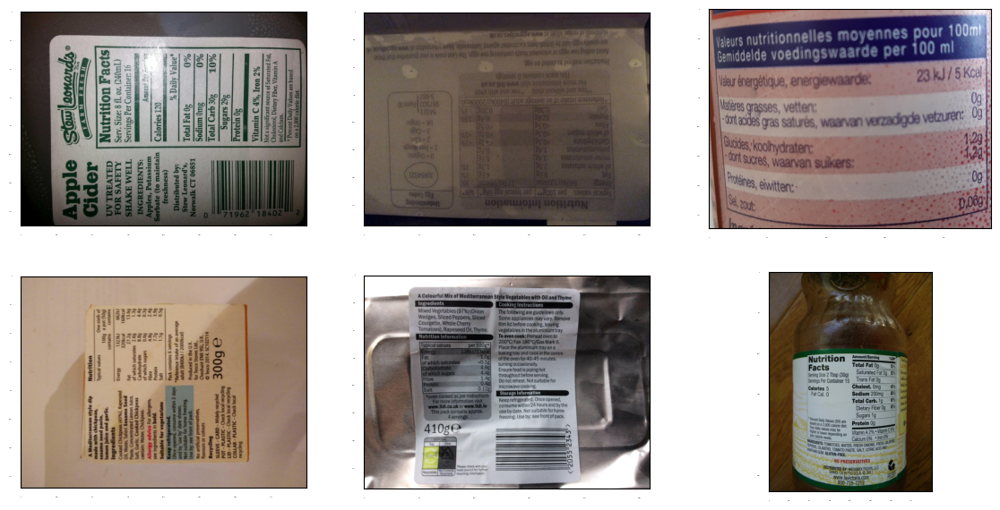

In [ ]:
%matplotlib inline

plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14, 7]

random_indices = random.sample(range(len(train_images_np)), 6)

# Show 6 random images from Used Train Images data
for idx, random_idx in enumerate(random_indices):
  plt.subplot(2, 3, idx+1)
  plt.imshow(train_images_np[random_idx])
plt.show()

## 8. Create Tensor Data from Images and Ground Truth Boxes

In [ ]:
tf.keras.backend.clear_session()

table_class_id = 1
category_index = {table_class_id: {'id': table_class_id, 'name': 'Nutrition Table'}}
num_classes = 1
label_id_offset = 1

train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []

for (train_image_np, gt_box_np) in zip(
    train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
      train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))
  
print(f'Done preparing {len(train_image_tensors)} data')


Done preparing 100 data


## 9. Display The Images with Their Ground Truth Boxes

In [ ]:
def plot_detections(image_np, boxes, classes, scores, category_index, figsize=(12, 16), image_name=None):
    # Find the index of the highest score
    max_score_idx = np.argmax(scores)
    
    # Get the box, class, and score with the highest score
    max_box = boxes[max_score_idx]
    max_class = classes[max_score_idx]
    max_score = scores[max_score_idx]
    
    image_np_with_annotations = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_annotations,
        np.array([max_box]),  
        np.array([max_class]),  
        np.array([max_score]),
        category_index,
        use_normalized_coordinates=True,
        min_score_thresh=0.1, # Lower the treshhold to show all predicted boxes 
    )
    
    if image_name:
        plt.imsave(image_name, image_np_with_annotations)
    else:
        plt.imshow(image_np_with_annotations)

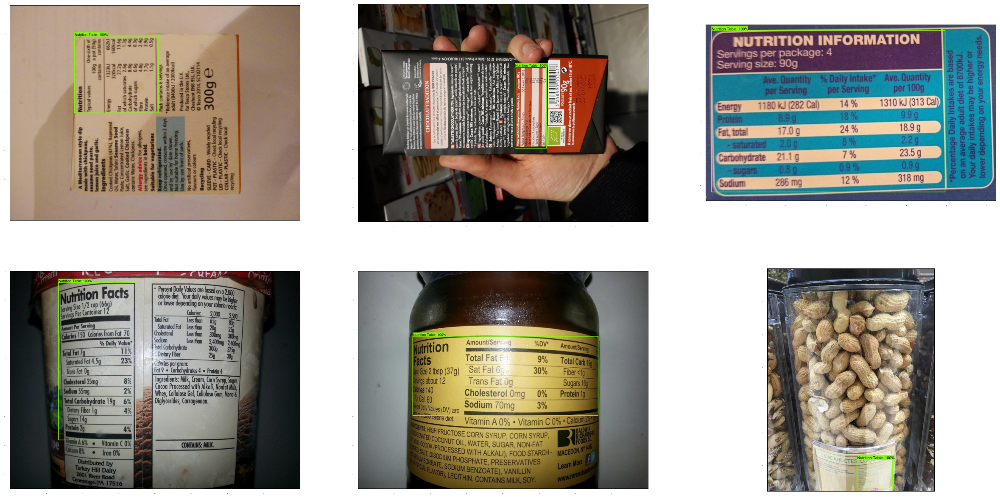

In [ ]:
%matplotlib inline

dummy_scores = np.array([1.0], dtype=np.float32)  # give boxes a score of 100%

# Show 6 random images from Used Train Images data with Ground Truth Boxes
random_indices = random.sample(range(len(train_images_np)), 6)
plt.figure(figsize=(30, 15))
for idx, random_idx in enumerate(random_indices):
    plt.subplot(2, 3, idx+1)
    gt_boxes_np = np.array(gt_boxes[random_idx])
    plot_detections(
            train_images_np[random_idx],
            gt_boxes_np,
            np.ones(shape=[gt_boxes_np.shape[0]], dtype=np.int32),
            dummy_scores, category_index)
plt.show()

## 10. Build a Pretrained SSD Resnet50 FPN Model and Fine Tune it with Used Train Images Data

In [ ]:
!git clone --depth 1 https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


In [ ]:
# Download the pre-trained model SSD ResNet50 V1 FPN 640x640 from TensorFlow Model Zoo
# Run this only once if there is no pre-trained model in the directory
!curl -OL http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0  233M    0  129k    0     0   132k      0  0:30:09 --:--:--  0:30:09  132k
  0  233M    0  747k    0     0   378k      0  0:10:30  0:00:01  0:10:29  379k
  0  233M    0  915k    0     0   307k      0  0:12:56  0:00:02  0:12:54  308k
  0  233M    0 1871k    0     0   471k      0  0:08:27  0:00:03  0:08:24  471k
  1  233M    1 4009k    0     0   806k      0  0:04:56  0:00:04  0:04:52  806k
  2  233M    2 6142k    0     0  1028k      0  0:03:52  0:00:05  0:03:47 1204k
  3  233M    3 9117k    0     0  1307k      0  0:03:02  0:00:06  0:02:56 1673k
  5  233M    5 12.7M    0     0  1643k      0  0:02:25  0:00:07  0:02:18 2438k
  7  233M    7 17.7M    0     0  2021k      0  0:01:58  0:00:08  0:01:50 3253k
  9  233M    9 23.1M    0     0  2377k      0  0:01

In [ ]:
# Extract the tar.gz file
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

# Define source of model checkpoint and destination path
source_path = 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint'
destination_path = 'models/research/object_detection/test_data/checkpoint'

# Copy the files, overwriting if they already exist
if os.path.exists(destination_path):
    shutil.rmtree(destination_path)
shutil.copytree(source_path, destination_path)

'models/research/object_detection/test_data/checkpoint'

In [ ]:
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)

# Load pipeline config and checkpoint to build detection model
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes # number of classes is 1
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(model_config=model_config, is_training=True) 

# Restore checkpoint
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    _box_prediction_head=detection_model._box_predictor._box_prediction_head)

fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)

ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Run model through a dummy image so that variables are Restored
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)

print('Weights restored!')

Building model and restoring weights for fine-tuning...
Weights restored!


Note: Below is the code for fine tuning. I want to train for 250 epoch but my noteboook get crashed at 100-ish epoch. So, I find the solution that the cell below have to run 5 times for each time is 50 epochs. First epoch on the first run is ~ 1.7 loss. In the end of training, I got 0.37 loss.

In [ ]:
tf.keras.backend.set_learning_phase(True)

batch_size = 16
learning_rate = 0.005
num_epoch = 50

# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Set up forward + backward pass for a single train step
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):

  # Use tf.function for a bit of speed
  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):

    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)

print('Start fine-tuning!', flush=True)

for idx in range(num_epoch):
  # Grab keys for a random subset of examples
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  # Get the ground truth
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  print('Epoch ' + str(idx+1) + '/' + str(num_epoch) + '  loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\backend.py:451: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


Start fine-tuning!
Epoch 1/50  loss=0.3907434
Epoch 2/50  loss=0.38829556
Epoch 3/50  loss=0.43317142
Epoch 4/50  loss=0.5122769


Epoch 5/50  loss=0.47275928


Epoch 6/50  loss=0.36312938
Epoch 7/50  loss=0.39904195
Epoch 8/50  loss=0.4232113
Epoch 9/50  loss=0.38039738
Epoch 10/50  loss=0.46042898
Epoch 11/50  loss=0.49547428
Epoch 12/50  loss=0.39723164
Epoch 13/50  loss=0.44212198
Epoch 14/50  loss=0.37225747
Epoch 15/50  loss=0.46810168
Epoch 16/50  loss=0.4512005
Epoch 17/50  loss=0.37918442
Epoch 18/50  loss=0.45969668
Epoch 19/50  loss=0.43579558
Epoch 20/50  loss=0.4161513
Epoch 21/50  loss=0.41760504
Epoch 22/50  loss=0.45616987
Epoch 23/50  loss=0.51422405
Epoch 24/50  loss=0.44802636
Epoch 25/50  loss=0.43770373
Epoch 26/50  loss=0.50207925
Epoch 27/50  loss=0.3862555
Epoch 28/50  loss=0.35957903
Epoch 29/50  loss=0.38048702
Epoch 30/50  loss=0.35639277
Epoch 31/50  loss=0.48186725
Epoch 32/50  loss=0.49369013
Epoch 33/50  loss=0.37534073
Epoch 34/50  loss=0.45096508
Epoch 35/50  loss=0.32820588
Epoch 36/50  loss=0.46551716
Epoch 37/50  loss=0.4872393
Epoch 38/50  loss=0.38384986
Epoch 39/50  loss=0.417383
Epoch 40/50  loss=0.36467

## 11. Display a Prediction on Used Train Images

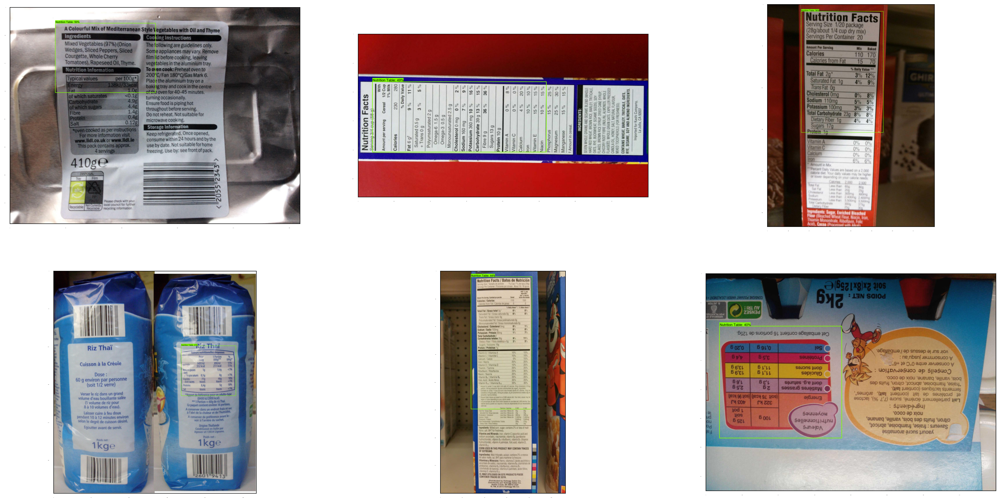

In [ ]:
# Display 6 random used train images with their prediction boxes
%matplotlib inline
plt.figure(figsize=(30, 15))
random_indices = random.sample(range(len(train_images_np)), 6)
for idx, random_idx in enumerate(random_indices):
  plt.subplot(2, 3, idx + 1)
  image_np = train_images_np[random_idx]
  input_tensor = tf.convert_to_tensor(image_np[tf.newaxis, ...], dtype=tf.float32)
  detections = detection_model(input_tensor)
  plot_detections(
    image_np,
    detections['detection_boxes'][0].numpy(),
    detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
    detections['detection_scores'][0].numpy(),
    category_index
  )
plt.show()

## 12. Display a Prediction on Validation/Unseen Images

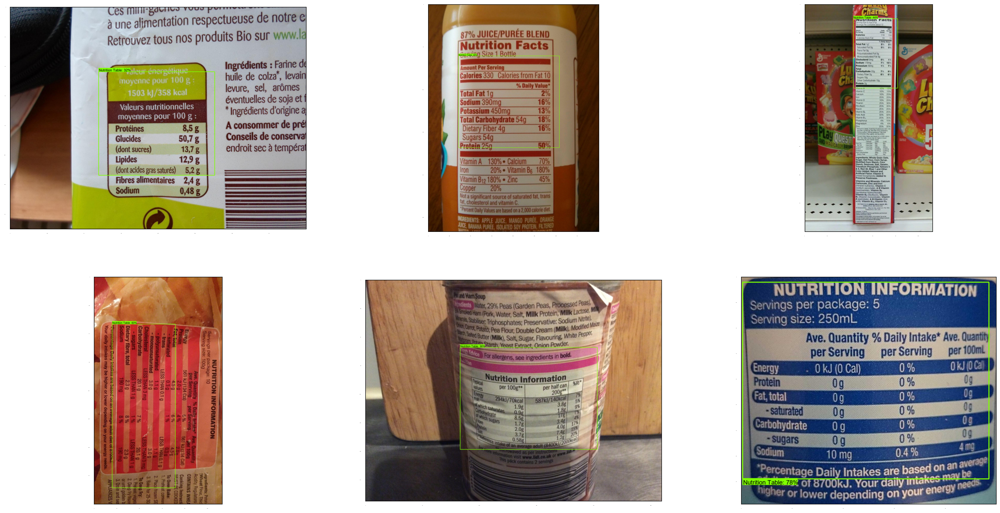

In [ ]:
# Display 6 random validation/unseen images with their prediction boxes
plt.figure(figsize=(30, 15))
random_indices = random.sample(range(len(val_images_np)), 6)
for idx, random_idx in enumerate(random_indices):
  plt.subplot(2, 3, idx + 1)
  image_np = val_images_np[random_idx]
  input_tensor = tf.convert_to_tensor(image_np[tf.newaxis, ...], dtype=tf.float32)
  detections = detection_model(input_tensor)
  plot_detections(
    image_np,
    detections['detection_boxes'][0].numpy(),
    detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
    detections['detection_scores'][0].numpy(),
    category_index
  )
plt.show()

## 13. Display a Prediction on Other Unseen Images

FileUpload(value=(), accept='image/*', description='Upload')

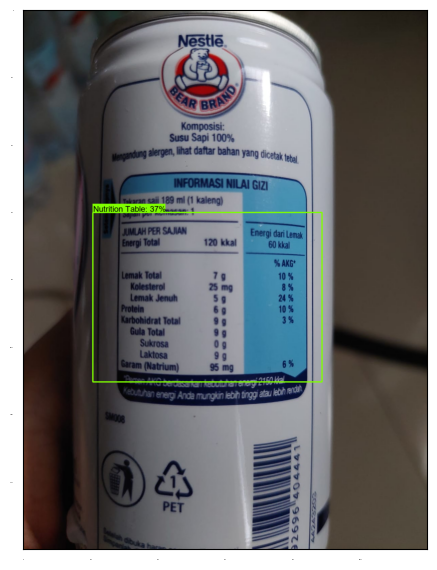

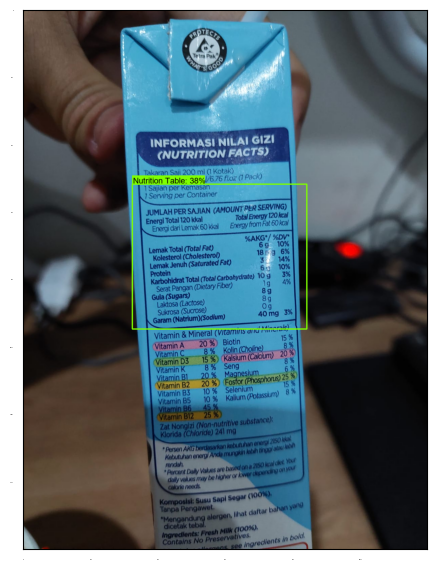

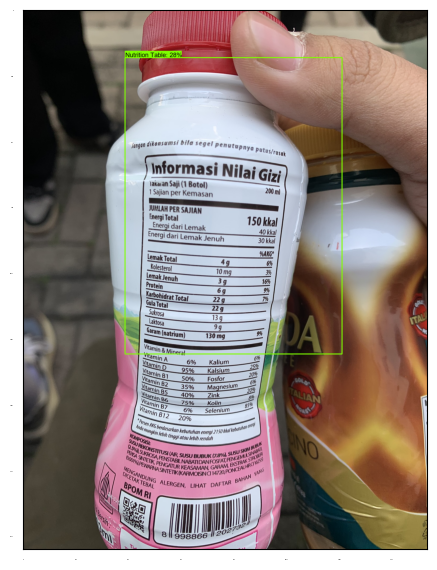

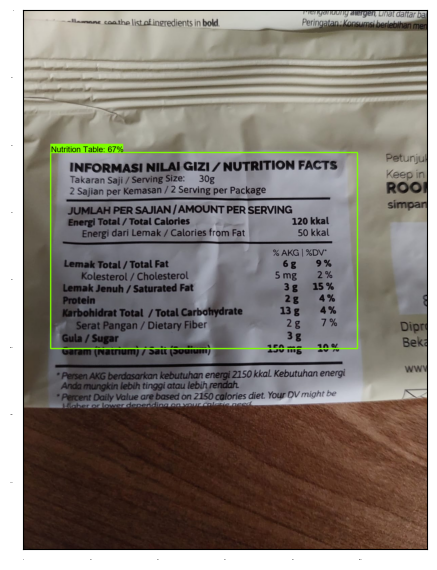

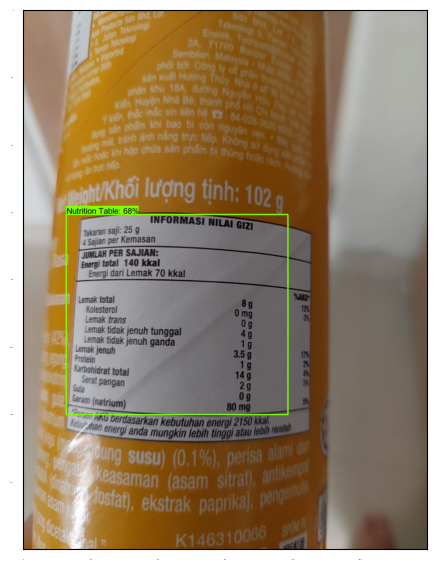

In [ ]:
def process_image(change):
    uploaded_file = change["new"]
    if uploaded_file:
        file_content = uploaded_file[0]["content"]
        image = Image.open(BytesIO(file_content)).convert("RGB")
        image_array = np.array(image)

        image_resized = tf.image.resize(image_array, (640, 640))
        input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
        detections = detection_model(input_tensor)

        plot_detections(
            image_np=image_array,
            boxes=detections['detection_boxes'][0].numpy(),
            classes=detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
            scores=detections['detection_scores'][0].numpy(),
            category_index=category_index
        )
        plt.show() 

# Upload 1 image
upload_widget = widgets.FileUpload(
    accept="image/*",
    multiple=False
)

# Bounding box prediction for the uploaded image and display the result
upload_widget.observe(process_image, names="value")

display(upload_widget)

## 14. Save the Model

In [ ]:
# Create a wrapper class to wrap the detection model
class DetectionModelWrapper(tf.keras.Model):
    def __init__(self, detection_model):
        super().__init__()
        self.detection_model = detection_model

    def call(self, inputs):
        # Forward pass model
        preprocessed_inputs, shapes = self.detection_model.preprocess(inputs)
        prediction_dict = self.detection_model.predict(preprocessed_inputs, shapes)
        return self.detection_model.postprocess(prediction_dict, shapes)

keras_model = DetectionModelWrapper(detection_model)

# Set up the model for export
dummy_input = tf.zeros([1, 640, 640, 3], dtype=tf.float32)
_ = keras_model(dummy_input)

# Save the model
output_path = '../model/table-detection-model'
keras_model.save(output_path)

print(f'Model successfully saved at {output_path}')

INFO:tensorflow:Assets written to: ../model/table-detection-model\assets


INFO:tensorflow:Assets written to: ../model/table-detection-model\assets


Model successfully saved at ../model/table-detection-model


## 15. Test to Import Saved Model and Predict (Opsional)

In [ ]:
# Import Saved Model
saved_model_path = '../model/table-detection-model'
detection_model = tf.saved_model.load(saved_model_path)

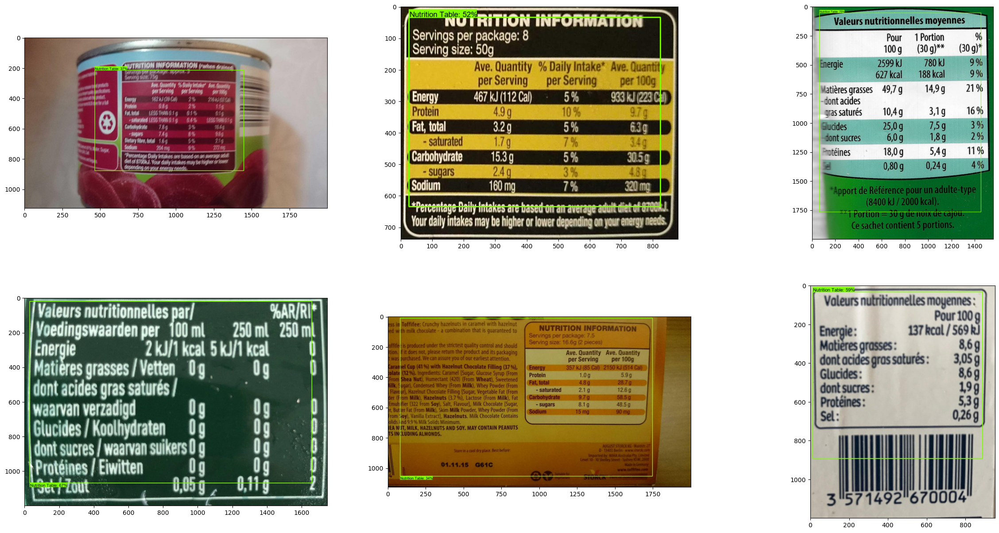

In [ ]:
# Predict 6 random images from validation/unseen data with the Imported Model
%matplotlib inline
def predict(image_path):
    image_np = load_image_into_numpy_array(image_path)
    image_resized = tf.image.resize(image_np, (640, 640))
    input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
    detections = detection_model(input_tensor)
    plot_detections(
        image_np,
        detections['detection_boxes'][0].numpy(),
        detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
        detections['detection_scores'][0].numpy(),
        category_index
    )
    
random_indices = random.sample(range(len(val_images_np)), 6)

plt.figure(figsize=(30, 15))
for idx, random_idx in enumerate(random_indices):
    plt.subplot(2, 3, idx+1)
    predict(os.path.join(val_image_dir, str(random_idx) + '.jpg'))
plt.show()

FileUpload(value=(), accept='image/*', description='Upload')

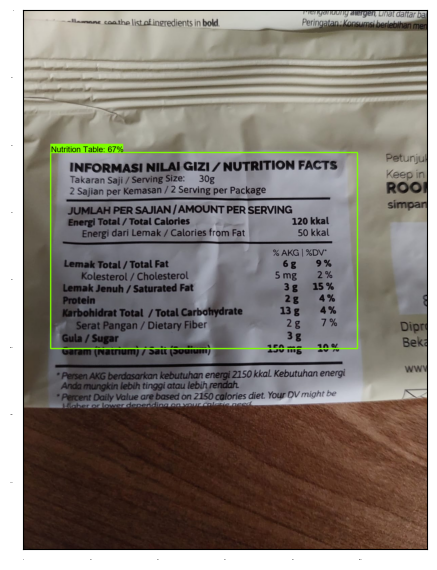

In [ ]:
# Predict 6 random images from other unseen data with the Imported Model
def process_image(change):
    uploaded_file = change["new"]
    if uploaded_file:
        file_content = uploaded_file[0]["content"]
        image = Image.open(BytesIO(file_content)).convert("RGB")
        image_array = np.array(image)

        image_resized = tf.image.resize(image_array, (640, 640))
        input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
        detections = detection_model(input_tensor)

        plot_detections(
            image_np=image_array,
            boxes=detections['detection_boxes'][0].numpy(),
            classes=detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
            scores=detections['detection_scores'][0].numpy(),
            category_index=category_index
        )
        plt.show() 

# Upload 1 image
upload_widget = widgets.FileUpload(
    accept="image/*",  
    multiple=False
)

# Bounding box prediction for the uploaded image and display the result
upload_widget.observe(process_image, names="value")

display(upload_widget)


## 16. Crop Predicted Table

FileUpload(value=(), accept='image/*', description='Upload')

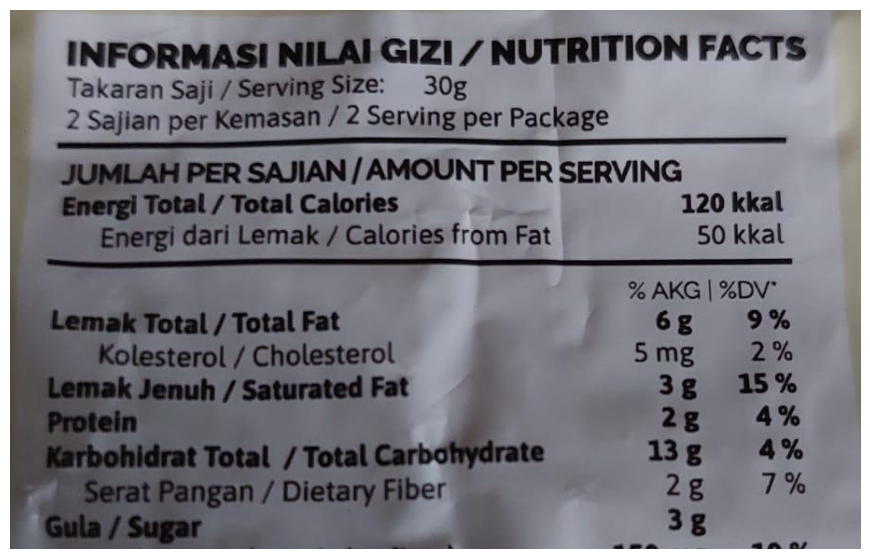

In [ ]:
# Crop the detected table from the image
def crop_table(image_path, output_path):
    image_np = load_image_into_numpy_array(image_path)
    image_resized = tf.image.resize(image_np, (640, 640))
    input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
    detections = detection_model(input_tensor)
    
    # Find the index of the highest score
    max_score_idx = np.argmax(detections['detection_scores'][0].numpy())
    
    # Get the box with the highest score
    max_box = detections['detection_boxes'][0].numpy()[max_score_idx]
    
    # Get the coordinates of the box
    ymin, xmin, ymax, xmax = max_box
    
    # Get the height and width of the image
    height, width, _ = image_np.shape
    
    # Get the coordinates of the box in the original image
    ymin = int(ymin * height)
    xmin = int(xmin * width)
    ymax = int(ymax * height)
    xmax = int(xmax * width)
    
    # Crop the table from the image
    table = image_np[ymin:ymax, xmin:xmax]
    
    # Save the cropped table
    table_image = Image.fromarray(table)
    table_image.save(output_path)
    
    # Display the cropped table
    plt.imshow(table_image)
    plt.axis('off')
    plt.show()
    
# Crop the detected table from the uploaded image
def process_image(change):
    uploaded_file = change["new"]
    if uploaded_file:
        file_content = uploaded_file[0]["content"]
        image = Image.open(BytesIO(file_content)).convert("RGB")
        image_array = np.array(image)
        
        # Save the uploaded image
        image.save('input_example/input2.jpg')
        
        # Crop the detected table from the uploaded image
        crop_table('input_example/input2.jpg', 'output_example/output2.jpg')
        
# Upload 1 image
upload_widget = widgets.FileUpload(
    accept="image/*",  
    multiple=False
)

# Crop the detected table from the uploaded image
upload_widget.observe(process_image, names="value")

display(upload_widget)

In [ ]:
def get_table(image):
    # Convert the image to numpy array
    image_np = np.array(image)
    
    # Resize the image
    image_resized = tf.image.resize(image_np, (640, 640))
    input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
    
    # Perform detection
    detections = detection_model(input_tensor)
    
    # Find the index of the highest score
    max_score_idx = np.argmax(detections['detection_scores'][0].numpy())
    
    # Get the box with the highest score
    max_box = detections['detection_boxes'][0].numpy()[max_score_idx]
    
    # Get the coordinates of the box
    ymin, xmin, ymax, xmax = max_box
    
    # Get the height and width of the image
    height, width, _ = image_np.shape
    
    # Get the coordinates of the box in the original image
    ymin = int(ymin * height)
    xmin = int(xmin * width)
    ymax = int(ymax * height)
    xmax = int(xmax * width)
    
    # Crop the table from the image
    table = image_np[ymin:ymax, xmin:xmax]
    
    return table

# Example usage:
# image = Image.open('path_to_image.jpg').convert("RGB")
# cropped_table = get_table(image)
# plt.imshow(cropped_table)
# plt.axis('off')
# plt.show()
